# Table of Contents

- [Initalize](#Initalize)
- [Goal](#Goal)
- [Wrangle](#Wrangle)
- [EDA](#Explore)
    - [NLP](#NLP)
    - [Continious Variables](#Continious-Variables)
    - [Insightful](#Insightful)
    - [Hypthosis Testing](#Hypothesis-Testing)
- [Modeling](#Modeling)
- [Results and Conclusions](#Results-&-Conclusions)
  - [Next Steps](#Next-Steps)
- [Appendix](#Appendix)
  - [Data Dictionary](#Data-Dictionary)
  - [Fun WordClouds](#Fun-WordClouds)

# Initalize

In [1]:
# establishing environment
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from scipy import stats
from wordcloud import WordCloud
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from scipy import stats

from wrangle import wrangle

import warnings
warnings.filterwarnings("ignore")

print('Initalized')

Initalized


# Goal
The goal of this project is to predict whether a Facebook Ad is political or not given data provided by [AdObsver](https://adobserver.org/). The reason this is important is because transparacy in Facebook advertisment is virtually non-existent and ephemeral; once an ad is no longer running those outside of Facebook do not know who paid for an ad. If we are able to use data in ad to predict if it is political, we then know which ads to look at in order to make predictions on what groups are running ads, when, and why they may be doing so. 

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


# Wrangle

Before we get started with the EDA there are a few things we need to do. First we need to pull in the data we'll use for analysis with the imported wrangle function, and then we will need to make some word objects from the data to conduct analysis on. Once the data is wrangled, we can then [explore](#Explore) it using various techniques.

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [2]:
help(wrangle)

Help on function wrangle in module wrangle:

wrangle(facebook_data_csv_location)
    This function requires that you download and unzip the file from the link below. File size is over 3gigs
    https://www.propublica.org/datastore/dataset/political-advertisements-from-facebook 
    Once unzipped, use the file path in the fuction to:
    * Load the csv into a pandas dataframe
    * Drops the following columns - 'listbuilding_fundraising_proba', 'targetedness', 'targetings', 'targets', 
    'targeting', 'images', 'lang', 'thumbnail', 'html', 'page_id', 'suppressed', 'entities', 'lower_page', 'id', and 'political_probability'
    * Create a socio_political_fb column that is 'Political' if facebook believes that the ad is about soical or political topics (advert_by is not null), 
    and 'Not Political' if facebook does not (advert_by is null)
    * Combine the advertiser and paid_for_by columns, with a priority given to paid_for_by values into a advert_by column
    * If advert_by column 

In [3]:
train, validate, test = wrangle('facebookads.csv')

In [4]:
train.head()

,political,not_political,title,message,created_at,updated_at,impressions,socio_political_fb,advert_by,known_ad_time,message_length,full_ad,full_ad_length,political_score
132967,0,0,end citizen united,koch said spend 400 million preserve republica...,2018-03-01 19:50:38.892007+00:00,2018-03-01 19:50:38.910542+00:00,2,Not Political,Arizona Democratic Party,1,9,koch said spend 400 million preserve republica...,12,0
171238,1,0,jay inslee,simple get jay debate stage june need 65000 do...,2019-05-15 00:47:15.677809+00:00,2019-05-15 02:08:15.943151+00:00,1,Political,INSLEE FOR AMERICA,1,10,simple get jay debate stage june need 65000 do...,12,1
157472,0,0,athens everyone,vote november 6 check voter guide information ...,2018-10-26 01:52:16.250883+00:00,2018-10-26 01:52:16.250883+00:00,1,Political,Athens for Everyone,1,9,vote november 6 check voter guide information ...,11,0
18371,2,2,ph pennsylvania horticultural society,httpsbitly34h5kvxa,2019-09-30 08:21:12.454423+00:00,2019-10-01 17:05:33.831098+00:00,1,Not Political,PHS : Pennsylvania Horticultural Society,2,1,httpsbitly34h5kvxa ph pennsylvania horticultur...,5,0
221209,0,0,planned parenthood,planned parenthood expert make life easier eve...,2020-04-28 00:09:46.224171+00:00,2020-04-28 15:00:14.714633+00:00,1,Political,Planned Parenthood Federation of America,1,19,planned parenthood expert make life easier eve...,21,0


In [5]:
# create series objects for messages socio_political_fb values that is a string of words joined on spaces 

political_words = ' '.join(train[train.socio_political_fb=='Political'].message)

# for javascript
not_political_words = ' '.join(train[train.socio_political_fb == 'Not Political'].message)

# both python and java script
all_words = ' '.join(train.message)

political_words

"simple get jay debate stage june need 65000 donor one vote november 6 check voter guide information candidate amendment planned parenthood expert make life easier every way phone video telehealth service deliver care information needwhenever need book appointment house voted pas shield act require campaign report offer assistance foreign entity fbi regulate political social medium ad not one republican voted yes bill mitch mcconnell ' hand ' looking dirty sign petition tell senator protecting election patriotic choice deadline approaching need help flip georgia blue right democrat jon ossoff running neck neck republican sen david perdue poll perdue corporate super pac bankrolling campaign jon isnt taking contribution corporate pac campaign relies grassroots donor like youre ready flip georgia blue win senate chip 5 gtgt httpsbitly2cqtroba since 2006 ' vaccinated 26 million child measles help u keep fighting deadly disease urgent coronavirus pandemic threatening life people around worl

In [6]:
# Then for each series remove any stand-alone characters to reduce noise
political_words = re.sub(r'\s.\s', '', political_words)
not_political_words = re.sub(r'\s.\s', '', not_political_words)
all_words = re.sub(r'\s.\s', '', all_words)

# Explore

Now that the data has been processed into more usable forms we can begin to explore the data for features we can use in building our models. We will use some [NLP](#NLP) analysis techniques to explore the data by creating [wordclouds](#WordClouds) and frequency charts from the top 20 words used across both political and non,political messages, and then we will create a frequency chart and word cloud charts by combining the top 10 words used by both political and non,political ads into a single word list. I will also create some scatter plots of the various [coutinious variables](#Continious). From the visualization we will get some [insights](#Insightful) into what features we can use in building our models.


**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


## NLP

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


In [7]:
# For each socio_political_fb find out how many times each word happens and put that into a topic_freq obj.
all_freq = pd.Series(all_words.split()).value_counts()
political_freq = pd.Series(political_words.split()).value_counts()
not_political_freq = pd.Series(not_political_words.split()).value_counts()

political_freq.head(10)

need        21718
help        16648
trump       14213
today       13790
make        12837
right       12533
campaign    11608
people      11303
vote         9714
get          9292
dtype: int64

In [8]:
not_political_freq.head(10)

need       5477
help       5261
trump      4422
today      4155
people     4143
support    3828
make       3299
right      3034
sign       2756
not        2680
dtype: int64

In [9]:
# Combine all the series together into a single data frame to see the word count across all topics
word_counts = (pd.concat([all_freq, political_freq, not_political_freq], axis=1, sort=True)
               .set_axis(['all', 'political', 'not_political', ], axis=1, inplace=False)
               .fillna(0)
               .apply(lambda s: s.astype(int))
              )

word_counts.head()

,all,political,not_political
000,2,0,2
00000,1,1,0
00972569215599,1,0,1
01,18,18,0
010l,1,0,1


In [10]:
# Top 10 words used by javascript
top10_political = word_counts['political'].sort_values(ascending=False).head(10)

# top 10 words by python
top10_notpolitical = word_counts['not_political'].sort_values(ascending=False).head(10)

# combines the lists together
top10_each = (list(top10_political.index) + list(top10_notpolitical.index))

# Create the new data frame where the index values match the top_10_each value
top10both = word_counts[word_counts.index.isin(top10_each)]

top10both.head(1)

,all,political,not_political
campaign,13305,11608,1698


In [11]:
# Create a top 20 all_words df
top20_all_words = word_counts['all'].sort_values(ascending=False).head(20)

top20_all_words

need        27197
help        21904
trump       18642
today       17930
make        16135
right       15573
people      15447
campaign    13305
support     12613
take        11667
like        10986
fight       10969
get         10964
vote        10932
not         10727
time        10685
new          9899
donation     9714
back         9528
one          8965
Name: all, dtype: int32

### WordClouds

[Table of Contents](#Table-of-Contents)

(-0.5, 799.5, 799.5, -0.5)

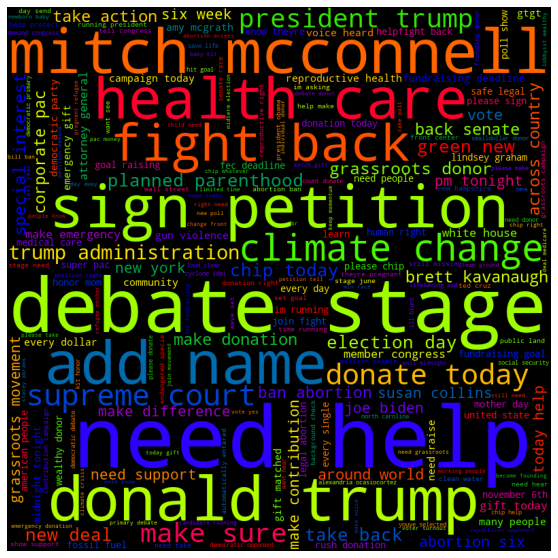

In [12]:
from wordcloud import WordCloud

plt.figure(figsize=(30,10))
political = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate(political_words)
plt.imshow(political)
plt.axis('off')

(-0.5, 799.5, 799.5, -0.5)

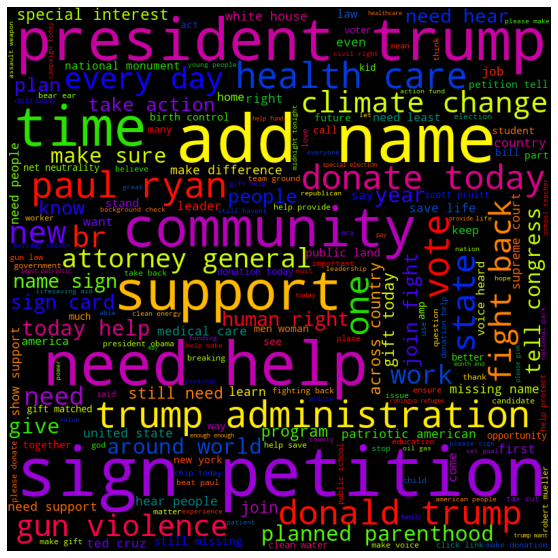

In [13]:
plt.figure(figsize=(30,10))
notpolitical = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate(not_political_words)
plt.imshow(notpolitical)
plt.axis('off')

(-0.5, 799.5, 799.5, -0.5)

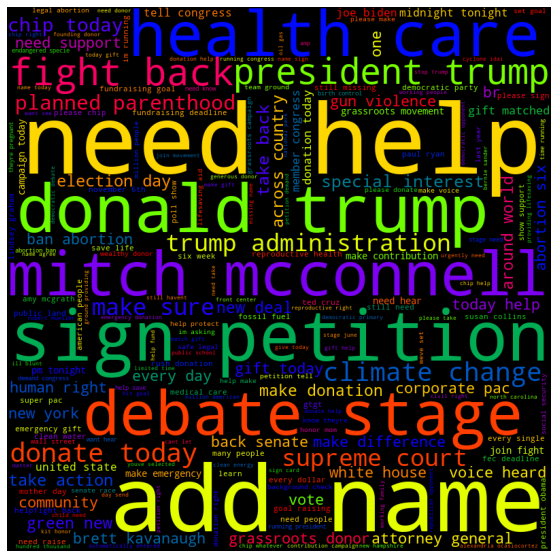

In [14]:
plt.figure(figsize=(30,10))
allwords = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate(all_words)
plt.imshow(allwords)
plt.axis('off')

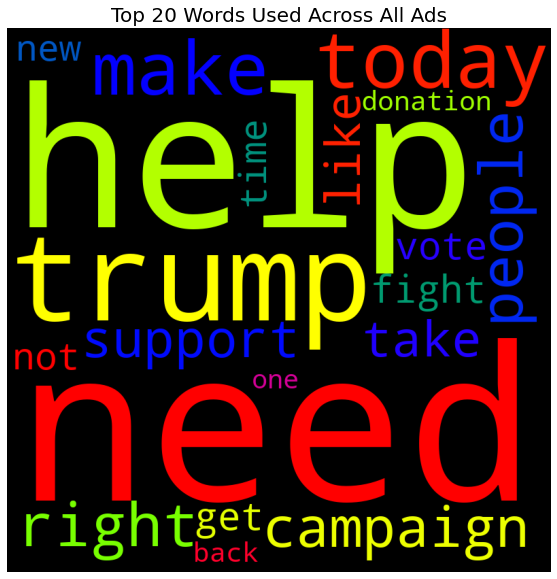

In [15]:
# Turn the dataframes into dictionaries
allz = {k: v for k, v in top20_all_words.to_dict().items()}

# Use the dictionary objects and .generate_from_frequencies method of WordCloud 
# to generate a wordcloud map for each language
all_top_20_cloud = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate_from_frequencies(allz)

plt.figure(figsize=(10,10))
plt.title("Top 20 Words Used Across All Ads", fontsize=20)
plt.imshow(all_top_20_cloud)
plt.axis('off')
plt.show()

<Figure size 1440x1008 with 0 Axes>

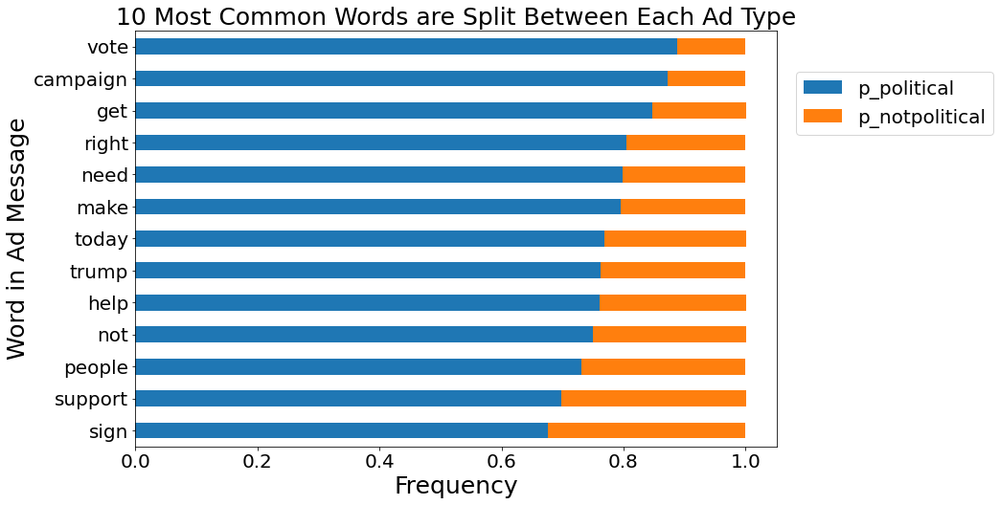

In [16]:
# visualize the percentage each coding language makes up for the top 10words of each Ad type
plt.figure(figsize=(20,14))
(top10both.assign(p_political = top10both.political/top10both['all'], 
                   p_notpolitical = top10both.not_political/top10both['all'])
 .sort_values(by='all')[['p_political', 'p_notpolitical']]
 .tail(20)
 .sort_values(by='p_political')
 .plot.barh(stacked=True, figsize=(12,8))
)

plt.title("10 Most Common Words are Split Between Each Ad Type", fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Frequency', fontsize=25)
plt.ylabel('Word in Ad Message', fontsize=25)
plt.legend(bbox_to_anchor=(1.03, .9),borderaxespad=0, fontsize=20)
plt.show()

## Continious Variables



**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [17]:
train.columns

Index(['political', 'not_political', 'title', 'message', 'created_at',
       'updated_at', 'impressions', 'socio_political_fb', 'advert_by',
       'known_ad_time', 'message_length', 'full_ad', 'full_ad_length',
       'political_score'],
      dtype='object')

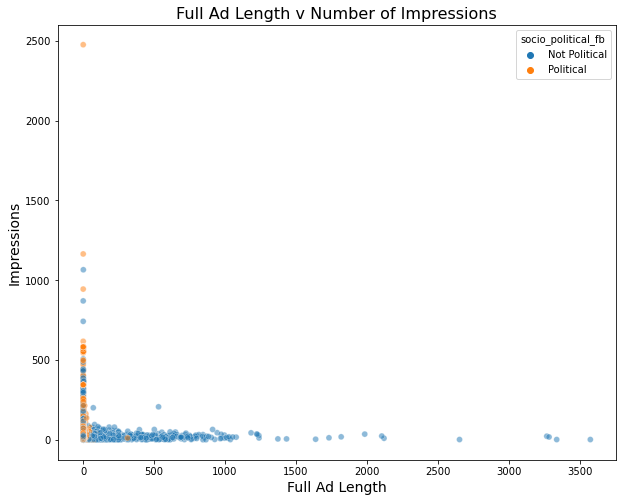

In [18]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=train, x='impressions', y='full_ad_length', hue='socio_political_fb', alpha=.5)
plt.xlabel('Full Ad Length', fontsize=14)
plt.ylabel('Impressions', fontsize=14)
plt.title('Full Ad Length v Number of Impressions', fontsize=16)
plt.show()

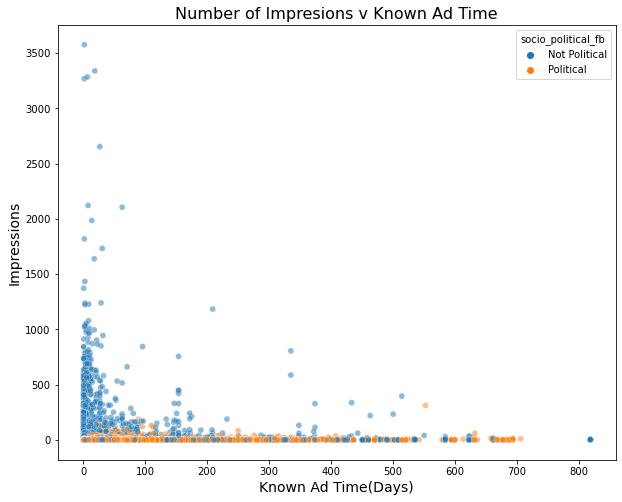

In [19]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=train, x='known_ad_time', y='impressions', hue='socio_political_fb', alpha=.5)
plt.xlabel('Known Ad Time(Days)', fontsize=14)
plt.ylabel('Impressions', fontsize=14)
plt.title('Number of Impresions v Known Ad Time', fontsize=16)
plt.show()

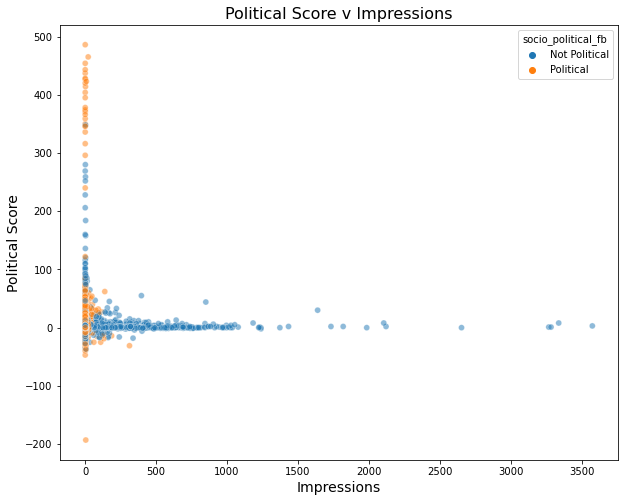

In [20]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=train, x='impressions', y='political_score', hue='socio_political_fb', alpha=.5)
plt.xlabel('Impressions', fontsize=14)
plt.ylabel('Political Score', fontsize=14)
plt.title('Political Score v Impressions', fontsize=16)
plt.show()

## Insightful 

As you can see, there are only 13 words in our top10 each list and that is due to the fact that both political and not political full_ad contain **'need', 'help', 'trump', 'today', 'make', 'right', and people** in their top 10 lists. However, political ads represent over 60% of each word's occurance within the corups. These may be words that we can add to our stop words list.

Additionally, it appears that political labled ads get less impresions, runs for a longer amount of time (in days), and have shorter ad length message. However, we need to do [hypothesis testing](#Hypothesis-Testing) to be sure.

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


<Figure size 1440x1008 with 0 Axes>

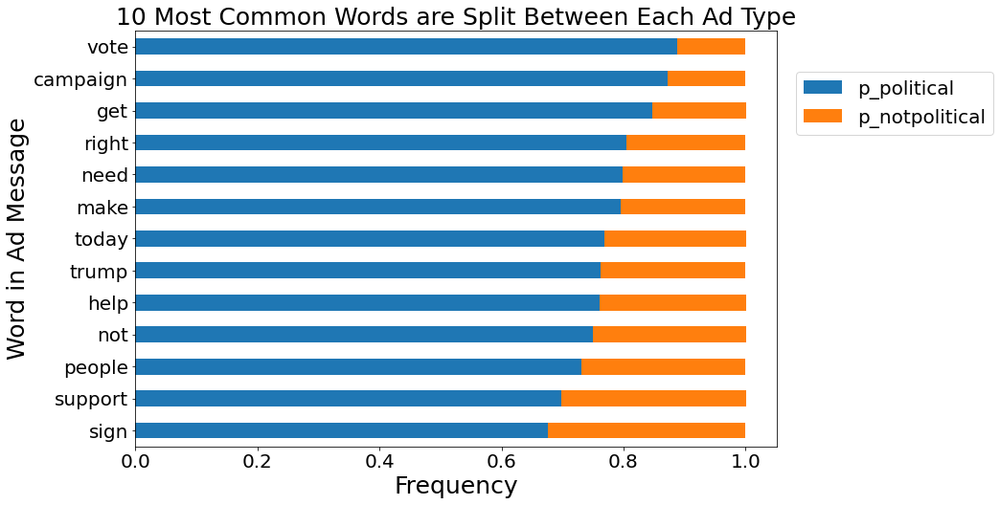

In [21]:
# visualize the percentage each coding language makes up for the top 10words of each Ad type
plt.figure(figsize=(20,14))
(top10both.assign(p_political = top10both.political/top10both['all'], 
                   p_notpolitical = top10both.not_political/top10both['all'])
 .sort_values(by='all')[['p_political', 'p_notpolitical']]
 .tail(20)
 .sort_values(by='p_political')
 .plot.barh(stacked=True, figsize=(12,8))
)

plt.title("10 Most Common Words are Split Between Each Ad Type", fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Frequency', fontsize=25)
plt.ylabel('Word in Ad Message', fontsize=25)
plt.legend(bbox_to_anchor=(1.03, .9),borderaxespad=0, fontsize=20)
plt.show()

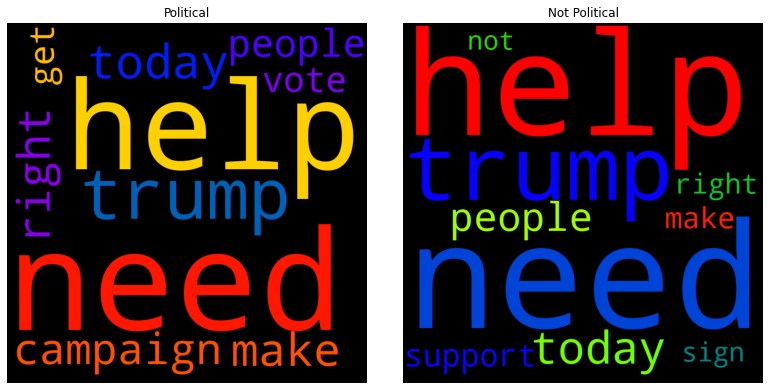

In [22]:
# Createa a top 10 words for each javascript and python
top10_political_words = word_counts['political'].sort_values(ascending=False).head(10)
top10_notpolitical_words = word_counts['not_political'].sort_values(ascending=False).head(10)

# Turn the dataframes into dictionaries
poli = {k: v for k, v in top10_political_words.to_dict().items()}
notpoli = {k: v for k, v in top10_notpolitical_words.to_dict().items()}


# Use the dictionary objects and .generate_from_frequencies method of WordCloud to generate a wordcloud map for each language
poli10_cloud = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate_from_frequencies(poli)

notpoli10_cloud = WordCloud(background_color='black', 
                      height=800, width=800, colormap='prism').generate_from_frequencies(notpoli)

# Change the figure size
plt.figure(figsize=(10,10))
axs = [plt.axes([.25, 1, .5, .5]), plt.axes([.8, 1, .5, .5])]

# imshow => display data as an image
axs[0].imshow(poli10_cloud)
axs[1].imshow(notpoli10_cloud)

axs[0].set_title('Political')
axs[1].set_title('Not Political')

# Turn off the axis
for ax in axs: ax.axis('off')

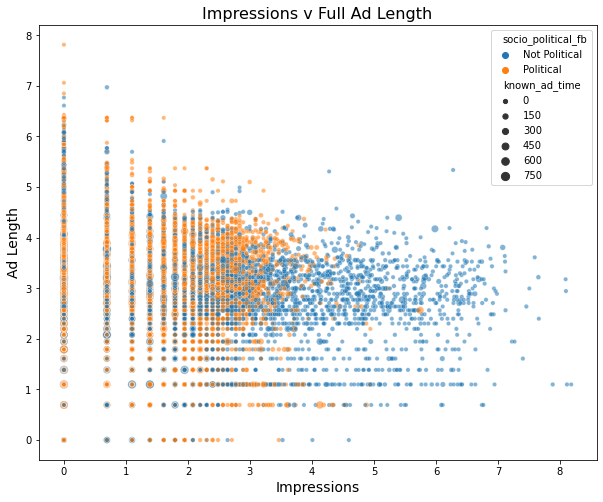

In [23]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=train, x=np.log(train['impressions']), y=np.log(train['full_ad_length']), hue='socio_political_fb', size='known_ad_time', alpha=.55)
plt.xlabel('Impressions', fontsize=14)
plt.ylabel('Ad Length', fontsize=14)
plt.title('Impressions v Full Ad Length', fontsize=16)
plt.show()

## Hypothesis Testing

For hypthosis testing we will conduct Two Sample; Two Tail T-test on our features. The hypthosis we will test are

* **[Impressions](#Impressions)**
  - $H0$ The average impressions of political ads is the same as the average impressions for non-political ads
  - $Ha$ The average impressions of political ads is less than the average impressions for non-political ads


* **[Ad Length](#Ad-Length)**

  - $H0$ The average ad length of political ads is the same as the average ad length for non-political ads
  - $Ha$ The average ad length of political ads is not the same as the avg ad length for non-political ads


* **[Known Ad Time](#Known-Ad-Time)**
  - $H0$ The average known ad time of political ads is the same as the average known ad time for non-political ads
  - $Ha$ The average known ad time of political ads is not the same as average known ad time for non-political ads

After running these test we rejected the null hypothisis of each test and therefore can use these features in our [models](#Modeling).

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


### Impressions
- $H0$ The average impressions of political ads is the same as the average impressions for non-political ads
- $Ha$ The average impressions of political ads is less than the average impressions for non-political ads


In [24]:
# Create the test samples
political = train.loc[train['socio_political_fb'] == "Political"]
not_political = train.loc[train['socio_political_fb'] == "Not Political"]

# Use ttest_ind to conduct the T-Test
t, p = stats.ttest_ind(political.impressions, not_political.impressions, equal_var = False)
a = .05
print(f't={t}, p={p}')
if p > a:
    print("We fail to reject H0")
elif t > 0:
    print("We fail to reject H0")
else:
    print("We reject H0")

t=-20.112400635488548, p=1.7943522628476644e-89
We reject H0


### Ad Length

- $H0$ The average ad length of political ads is the same as the average ad length for non-political ads
- $Ha$ The average ad length of political ads is not the same as the avg ad length for non-political ads


In [25]:
# Use ttest_ind to conduct the T-Test
t, p = stats.ttest_ind(political.full_ad_length, not_political.full_ad_length, equal_var = False)
a = .05
print(f't={t}, p={p/2}')
if p/2 > a:
    print("We fail to reject H0")
elif t <= 0:
    print("We fail to reject H0")
else:
    print("We reject H0")

t=22.930511409591787, p=3.2318794507072807e-116
We reject H0


### Known Ad Time
- $H0$ The average known ad time of political ads is the same as the average known ad time for non-political ads
- $Ha$ The average known ad time of political ads is not the same as the average known ad time for non-political ads


In [26]:
# Use ttest_ind to conduct the T-Test
t, p = stats.ttest_ind(political.known_ad_time, not_political.known_ad_time, equal_var = False)
a = .05
print(f't={t}, p={p/2}')
if p/2 > a:
    print("We fail to reject H0")
elif t >= 0:
    print("We fail to reject H0")
else:
    print("We reject H0")

t=-9.165471747281073, p=2.549568706061375e-20
We reject H0


# Modeling
Now that we know our chosen features are all statistically significant, we will create 6 models. The models are as follows:

* **[Baseline](#Baseline)** model where every ad is a political ad
* **[Model 1](#Model-1)** uses bag-of-words on message to create a feature and logistic regression to predict ad type
* **[Model 2](#Model-2)** uses bag-of-words on full ad to create a feature and logistic regression to predict ad type
* **[Model 3](#Model-3)** uses tf-idf on message to create a feature and logistic regression to predict ad type
* **[Model 4](#Model-4)** uses tf-idf on full_ad to create a feature and logistic regression to predict ad type
* **[Model 5](#Model-5)** uses ad_length, known_ad_time, and impressions as features in a logistic regression model to predict ad type


We will use F1-score as our evaluation metric. The reason for using F1-score is because we want to correctly identify when an ad is in fact political in nature or not, and thus care equally about both false negatives and false positives results.

Once the models are created, we will [conclude](#Results-&-Conclusions) by evaluating the best performing model on the test set.

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [27]:
# checking which language is most prominent
train.socio_political_fb.value_counts()

Political        97498
Not Political    35785
Name: socio_political_fb, dtype: int64

### Baseline
- Always predicts political ad since that is the most common language

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [28]:
# setting baseline prediction to always be javascript
train['baseline_prediction'] = 'Political'

# printing performance metrics
print(classification_report(train.socio_political_fb, train.baseline_prediction))

               precision    recall  f1-score   support

Not Political       0.00      0.00      0.00     35785
    Political       0.73      1.00      0.84     97498

     accuracy                           0.73    133283
    macro avg       0.37      0.50      0.42    133283
 weighted avg       0.54      0.73      0.62    133283



## Model 1

Uses bag-of-words on message to create a feature based on ad message and uses logistic regression to predictit ad type.

### Train


**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [29]:
# setting target variable
y_train = train['socio_political_fb']

# creating vectorizer
vectorizer = CountVectorizer(stop_words='english', 
                             min_df=20, 
                             ngram_range=(1,2), 
                             binary=True)

# Learn vocabulary in sentences. 
vectorizer.fit(train.message)

# Get dictionary. 
vectorizer.get_feature_names()

# Transform each sentences in vector space.
bow = vectorizer.transform(train.message)

X_bow = bow

# creating logistic regression object
message_lr_bag = LogisticRegression(random_state=123)

# fitting model to data
message_lr_bag = message_lr_bag.fit(X_bow, y_train)

train['message_bag_prediction'] = message_lr_bag.predict(X_bow)

print(classification_report(train.socio_political_fb, train.message_bag_prediction))

               precision    recall  f1-score   support

Not Political       0.89      0.63      0.74     35785
    Political       0.88      0.97      0.92     97498

     accuracy                           0.88    133283
    macro avg       0.88      0.80      0.83    133283
 weighted avg       0.88      0.88      0.87    133283



### Validate

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [30]:
# Transform each sentence in vector space.
v_bow = vectorizer.transform(validate.message)

# adding prediction column
validate['message_bag_prediction'] = message_lr_bag.predict(v_bow)

# printing evaluation metrics
print(classification_report(validate.socio_political_fb, validate.message_bag_prediction))

               precision    recall  f1-score   support

Not Political       0.79      0.55      0.65     11929
    Political       0.85      0.95      0.90     32499

     accuracy                           0.84     44428
    macro avg       0.82      0.75      0.77     44428
 weighted avg       0.83      0.84      0.83     44428



# Model 2


Uses bag-of-words on full ad to create a feature and logistic regression to predict ad type


## Train

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [31]:
# creating vectorizer
vectorizer = CountVectorizer(stop_words='english', 
                             min_df=20, 
                             ngram_range=(1,2), 
                             binary=True)

# Learn vocabulary in sentences. 
vectorizer.fit(train.full_ad)

# Get dictionary. 
vectorizer.get_feature_names()

# Transform each sentences in vector space.
bow = vectorizer.transform(train.full_ad)

X_bow = bow

# creating logistic regression object
fullad_lr_bag = LogisticRegression(random_state=123)

# fitting model to data
fullad_lr_bag = fullad_lr_bag.fit(X_bow, y_train)

train['fullad_bag_prediction'] = fullad_lr_bag.predict(X_bow)

print(classification_report(train.socio_political_fb, train.fullad_bag_prediction))

               precision    recall  f1-score   support

Not Political       0.88      0.76      0.81     35785
    Political       0.91      0.96      0.94     97498

     accuracy                           0.91    133283
    macro avg       0.90      0.86      0.88    133283
 weighted avg       0.91      0.91      0.91    133283



### Validate

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [32]:
# Transform each sentence in vector space.
v_bow = vectorizer.transform(validate.full_ad)

# adding prediction column
validate['fullad_bag_prediction'] = fullad_lr_bag.predict(v_bow)

# printing evaluation metrics
print(classification_report(validate.socio_political_fb, validate.fullad_bag_prediction))

               precision    recall  f1-score   support

Not Political       0.80      0.67      0.73     11929
    Political       0.89      0.94      0.91     32499

     accuracy                           0.87     44428
    macro avg       0.84      0.80      0.82     44428
 weighted avg       0.86      0.87      0.86     44428



## Model 3

Uses tf-idf on message to create a feature and logistic regression to predict ad type


### Train

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [33]:
# creating tfidf vectorizer
tfidf = TfidfVectorizer(stop_words='english', min_df = 20,
                             ngram_range=(1,2), 
                             binary=True)

# fitting and transforming readme data 
tfidf_sparse_matrix = tfidf.fit_transform(train.message)

# get vocabulary
tfidf.vocabulary_

# Transform to document-term matrix
vector_spaces = tfidf.transform(train.message)

X_tfidf = tfidf_sparse_matrix

# creating logistic regression object
message_lr_tfidf = LogisticRegression(random_state=123)

# fitting data model to data
message_lr_tfidf = message_lr_tfidf.fit(X_tfidf, y_train)

train['message_tfidf_prediction'] = message_lr_tfidf.predict(X_tfidf)

print(classification_report(train.socio_political_fb, train.message_tfidf_prediction))

               precision    recall  f1-score   support

Not Political       0.87      0.51      0.65     35785
    Political       0.84      0.97      0.90     97498

     accuracy                           0.85    133283
    macro avg       0.86      0.74      0.77    133283
 weighted avg       0.85      0.85      0.83    133283



### Validate

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [34]:
# transforming readme data
tfidf_sparse_matrix = tfidf.transform(validate.message)

# Transform to document-term matrix
vector_spaces = tfidf.transform(validate.message)

X_tfidf = tfidf_sparse_matrix

# adding prediction column
validate['message_tfidf_prediction'] = message_lr_tfidf.predict(X_tfidf)

# printing evaluation metrics
print(classification_report(validate.socio_political_fb, validate.message_tfidf_prediction))

               precision    recall  f1-score   support

Not Political       0.80      0.46      0.58     11929
    Political       0.83      0.96      0.89     32499

     accuracy                           0.82     44428
    macro avg       0.82      0.71      0.74     44428
 weighted avg       0.82      0.82      0.81     44428



## Model 4


Uses tf-idf on full_ad to create a feature and logistic regression to predict ad type



### Train

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [35]:
# creating tfidf vectorizer
tfidf = TfidfVectorizer(stop_words='english', min_df = 20,
                             ngram_range=(1,2), 
                             binary=True)

# fitting and transforming readme data 
tfidf_sparse_matrix = tfidf.fit_transform(train.full_ad)

# get vocabulary
tfidf.vocabulary_

# Transform to document-term matrix
vector_spaces = tfidf.transform(train.full_ad)

X_tfidf = tfidf_sparse_matrix

# creating logistic regression object
fullad_lr_tfidf = LogisticRegression(random_state=123)

# fitting data model to data
fullad_lr_tfidf = fullad_lr_tfidf.fit(X_tfidf, y_train)

train['fullad_tfidf_prediction'] = fullad_lr_tfidf.predict(X_tfidf)

print(classification_report(train.socio_political_fb, train.fullad_tfidf_prediction))

               precision    recall  f1-score   support

Not Political       0.86      0.63      0.72     35785
    Political       0.87      0.96      0.92     97498

     accuracy                           0.87    133283
    macro avg       0.87      0.79      0.82    133283
 weighted avg       0.87      0.87      0.87    133283



### Validate

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [36]:
# transforming full ad data
tfidf_sparse_matrix = tfidf.transform(validate.full_ad)

# Transform to document-term matrix
vector_spaces = tfidf.transform(validate.full_ad)

X_tfidf = tfidf_sparse_matrix

# adding prediction column
validate['fullad_tfidf_prediction'] = fullad_lr_tfidf.predict(X_tfidf)

# printing evaluation metrics
print(classification_report(validate.socio_political_fb, validate.fullad_tfidf_prediction))

               precision    recall  f1-score   support

Not Political       0.81      0.57      0.67     11929
    Political       0.86      0.95      0.90     32499

     accuracy                           0.85     44428
    macro avg       0.84      0.76      0.79     44428
 weighted avg       0.85      0.85      0.84     44428



## Model 5



Uses ad_length, known_ad_time, and impressions as features in a logistic regression model to predict ad type

### Train


**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)

In [37]:
from sklearn.tree import DecisionTreeClassifier

# setting target variable
y_train = train['socio_political_fb']

# creating vectorizer
X_train = train[['impressions', 'full_ad_length', 'known_ad_time']]

clf = DecisionTreeClassifier(max_depth=3, random_state=333)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_train)
y_pred_proba = clf.predict_proba(X_train)
print(classification_report(y_train, y_pred))

               precision    recall  f1-score   support

Not Political       0.58      0.15      0.23     35785
    Political       0.75      0.96      0.85     97498

     accuracy                           0.74    133283
    macro avg       0.67      0.55      0.54    133283
 weighted avg       0.71      0.74      0.68    133283



# Results & Conclusions

After building our models and validating the ones that performed best on train, we found that **[Model 2](#Model-2)**, which used bag-of-words on the full ad feature, showed the most promise. All that is left is to run the model on the test data set to ensure that it isn't overfitted. As you can see, the model appears to be very slightly overfitted to the train data set, but it still performs quite well on the test dataset showing a f1-score of 91% for 'political' ads and 72% for 'not political' ads. 

Based on the current model, I would recommend Facebook, if it isn't already, to create a BoW feature for it's political ad classification system and look at [next steps](#Next-Steps) for additional guidance

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


### Model 2 Test

In [38]:
# Transform each sentence in vector space.
v_bow = vectorizer.transform(test.full_ad)

# adding prediction column
test['fullad_bag_prediction'] = fullad_lr_bag.predict(v_bow)

# printing evaluation metrics
print(classification_report(test.socio_political_fb, test.fullad_bag_prediction))

               precision    recall  f1-score   support

Not Political       0.79      0.66      0.72     11928
    Political       0.88      0.94      0.91     32500

     accuracy                           0.86     44428
    macro avg       0.84      0.80      0.82     44428
 weighted avg       0.86      0.86      0.86     44428



## Next Steps

While the our BoW on the full ad feature worked really well, there is always room for improvement. For the next iteration(s) of this project I would:

* Remove the following words from the full_ad feature: **need', 'help', 'trump', 'today', 'make', 'right', and people**
* See if AdObserver users political_score has any bearing on whether an ad is political or not
* Create a contains_candidate feature where true if a political candidate's name is mentioned in full_ad 
* See if combining BoW features with other features improves the model
* See if there are any clusters of features that may identify political ads

**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


# Appendix

- [Data Dictionary](#Data-Dictionary)
- [Fun WordClouds](#Fun-WordClouds)


**Jump to** [Table of Contents](#Table-of-Contents), [Goals](#Goal), [Wrangle](#Wrangle), [EDA](#Explore), [NLP](#NLP), [Continious Variables](#Continious-Variables), [Insightful](#Insightful), [Hypthosis Testing](#Hypothesis-Testing), [Modeling](#Modeling), [Results and Conclusions](#Results-&-Conclusions), [Next Steps](#Next-Steps), [Appendix](#Appendix)


# Data Dictionary

| Name | Description |
|---|---|
| message  | The text of the ad's message  |
| title  | The title of the ad  |
| full_ad  | The text of the ad's message and title  |
| political  | The number of times an AdObserver users rated an ad political  |
| not_political  | The number of times an AdObserver users rated an ad non-political  |
| created_at  | The date and time an ad was first seen  |
| updated_at  | The date and time that an ad was last seen  |
| known_ad_time  | The number of days an ad was known to run. Adds a day to account for when the ad was first seen  |
| impressions  | The number of time an ad was seen  |
| political_score  | The difference between a the user rating of political and not_political  |
| advert_by  | Who published the ad  |
| socio_political_fb | How facebook classifies an ad  |
| message_length  | The number of words contained in an ad's message |
| full_ad_length  |  The number of words contained in an ad's full_ad |


## Fun WordClouds
**Jump to** [Table of Contents](#Table-of-Contents)

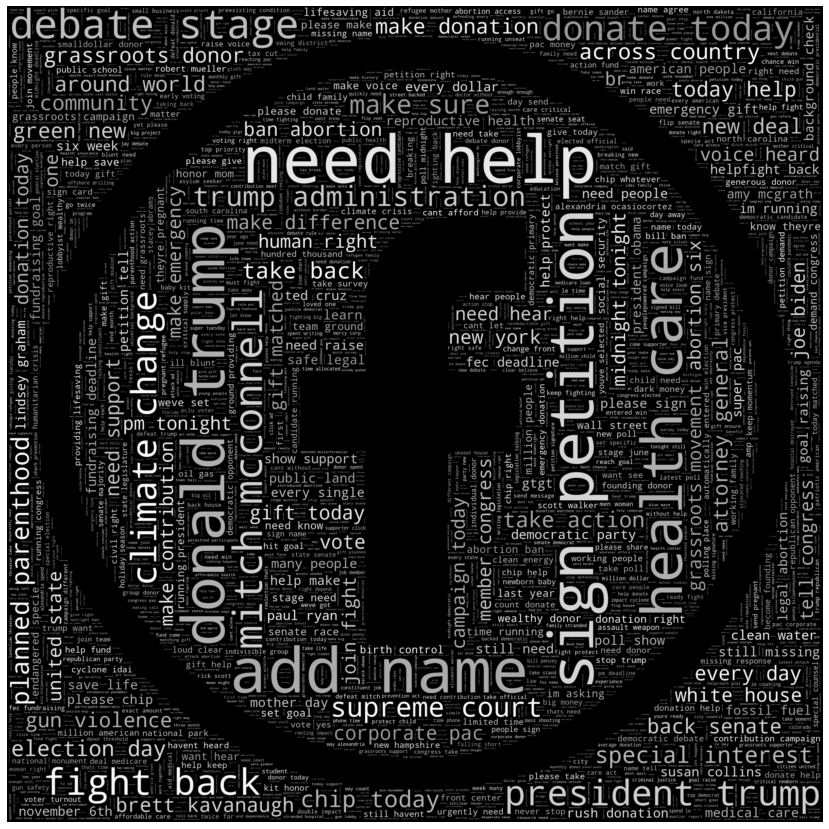

In [39]:
# All the words used in corpus

from PIL import Image
import random


mask = np.array(Image.open("images/fb.png"))

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

wc = WordCloud(max_words=3000, mask=mask, margin=10,
               random_state=1).generate(all_words)
# store default colored image
default_colors = wc.to_array()
plt.figure(figsize=(15,15))
plt.imshow(wc.recolor(color_func=grey_color_func, random_state=3),
           interpolation="bilinear")
#wc.to_file("a_new_hope.png")
plt.axis("off")
plt.show()

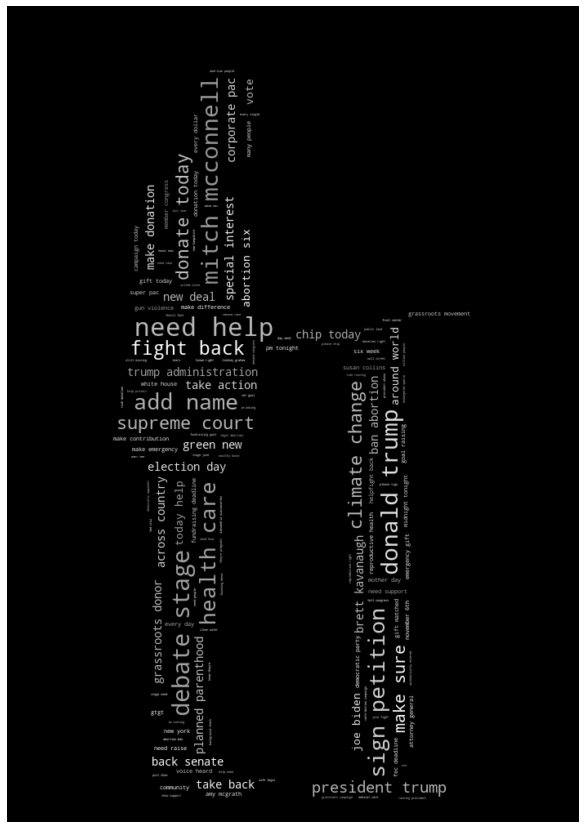

In [40]:
# Created using political words in the corpus

from PIL import Image
import random


mask = np.array(Image.open("images/test.jpg"))

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

wc = WordCloud(max_words=3000, mask=mask, margin=10,
               random_state=1).generate(political_words)
# store default colored image
default_colors = wc.to_array()
plt.figure(figsize=(15,15))
plt.imshow(wc.recolor(color_func=grey_color_func, random_state=3),
           interpolation="bilinear")
#wc.to_file("a_new_hope.png")
plt.axis("off")
plt.show()

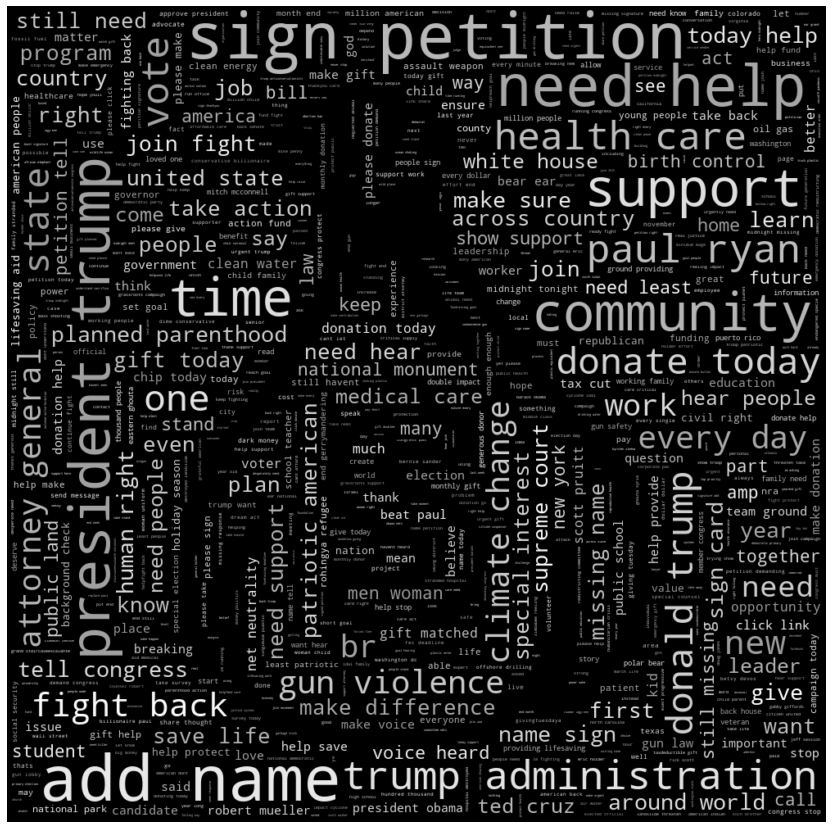

In [41]:
# Created using the non-political words in the corpus

from PIL import Image
import random


mask = np.array(Image.open("images/moneybag.jpg"))

def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

wc = WordCloud(max_words=3000, mask=mask, margin=10,
               random_state=1).generate(not_political_words)
# store default colored image
default_colors = wc.to_array()
plt.figure(figsize=(15,15))
plt.imshow(wc.recolor(color_func=grey_color_func, random_state=3),
           interpolation="bilinear")
#wc.to_file("a_new_hope.png")
plt.axis("off")
plt.show()

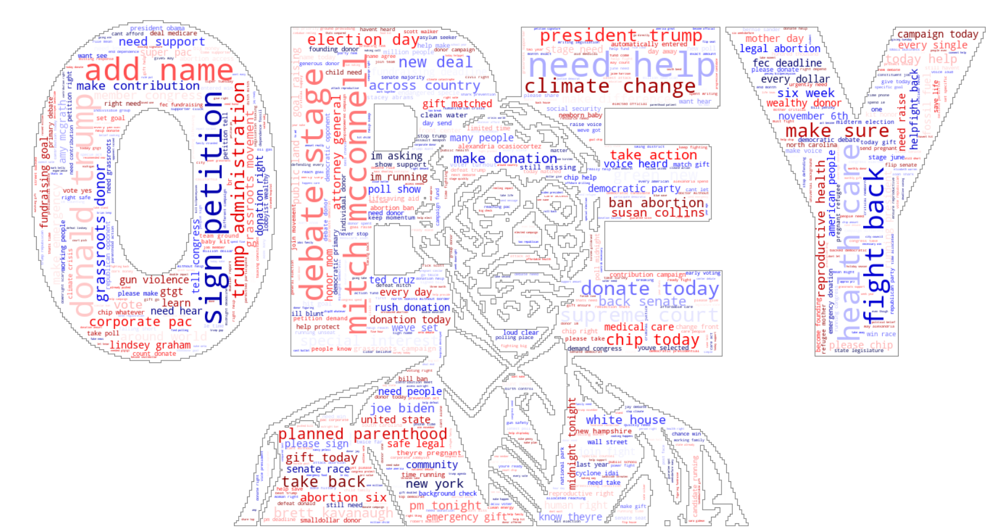

In [42]:
# Created using the political words in the corpus

mask = np.array(Image.open("images/obey2.png"))

wc = WordCloud(background_color="white", max_words=1000, mask=mask, contour_width=.10, contour_color='gray', colormap='seismic')

# generate word cloud
wc.generate(political_words)

# show
plt.figure(figsize=(30,50))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

**Jump to** [Table of Contents](#Table-of-Contents)